Loading 10 subjects...

Activity: Waist bends forward (ID: 6)
Using Features: ['acc_chest_x', 'acc_chest_y', 'acc_chest_z', 'acc_arm_x', 'acc_arm_y', 'acc_arm_z']

>>> Visualizing mHealthsubject1 - Waist bends forward


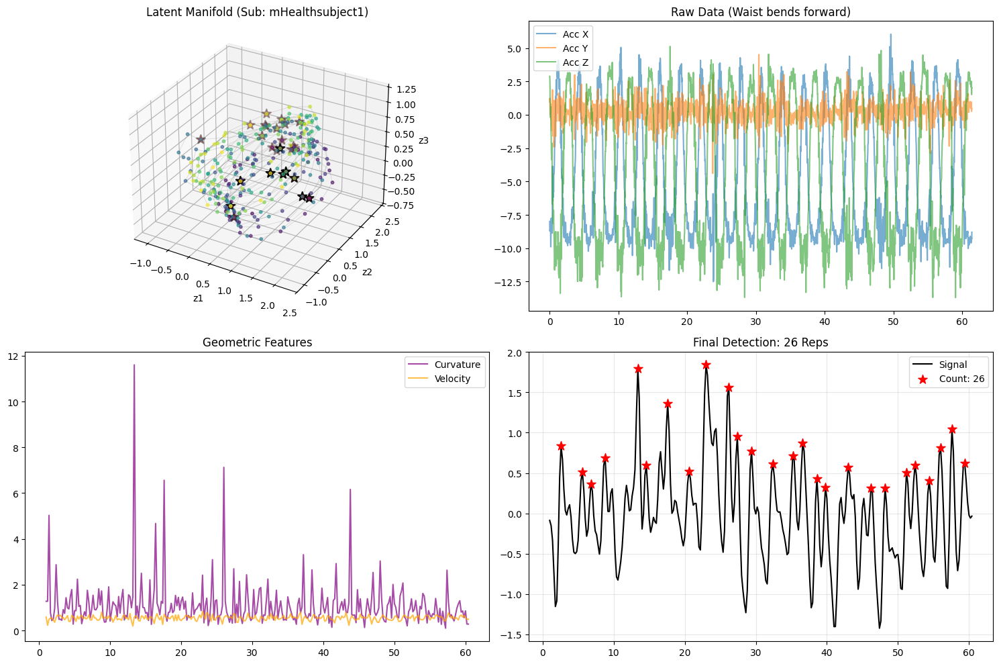


>>> Visualizing mHealthsubject2 - Waist bends forward


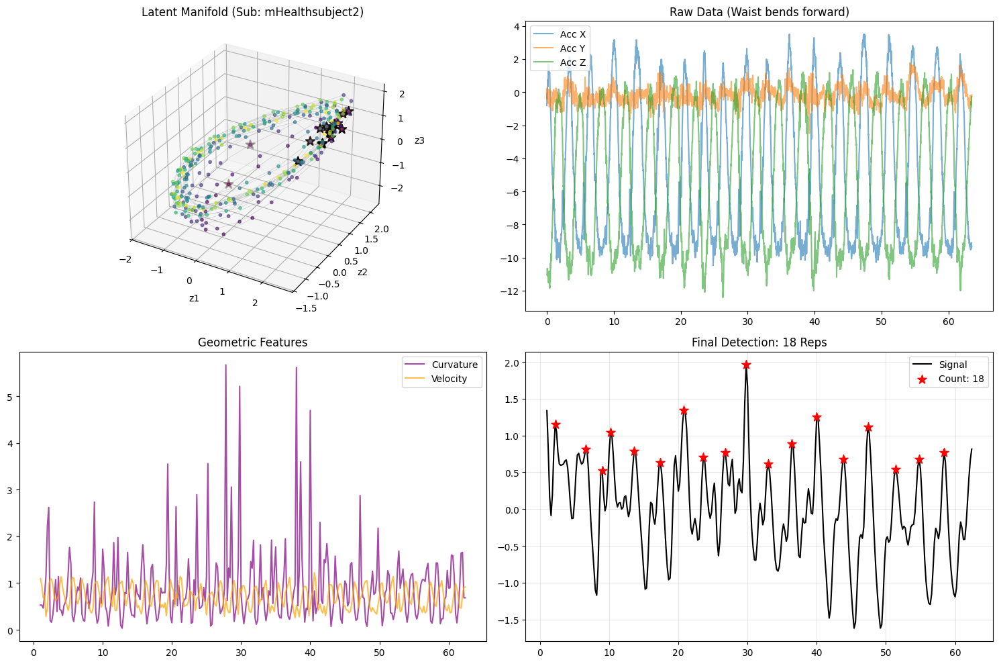


>>> Visualizing mHealthsubject3 - Waist bends forward


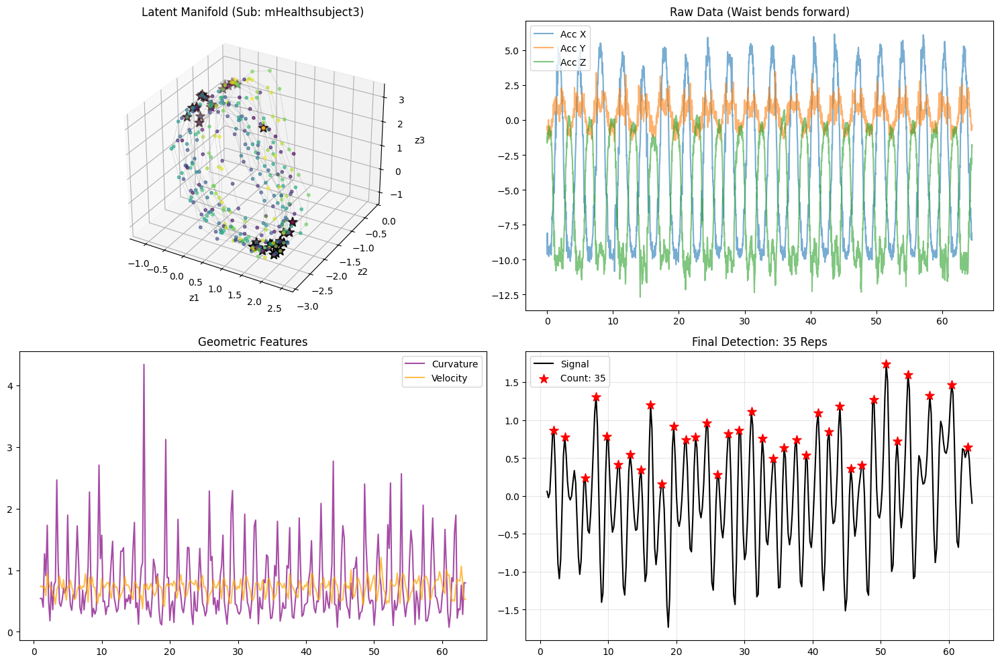


>>> Visualizing mHealthsubject4 - Waist bends forward


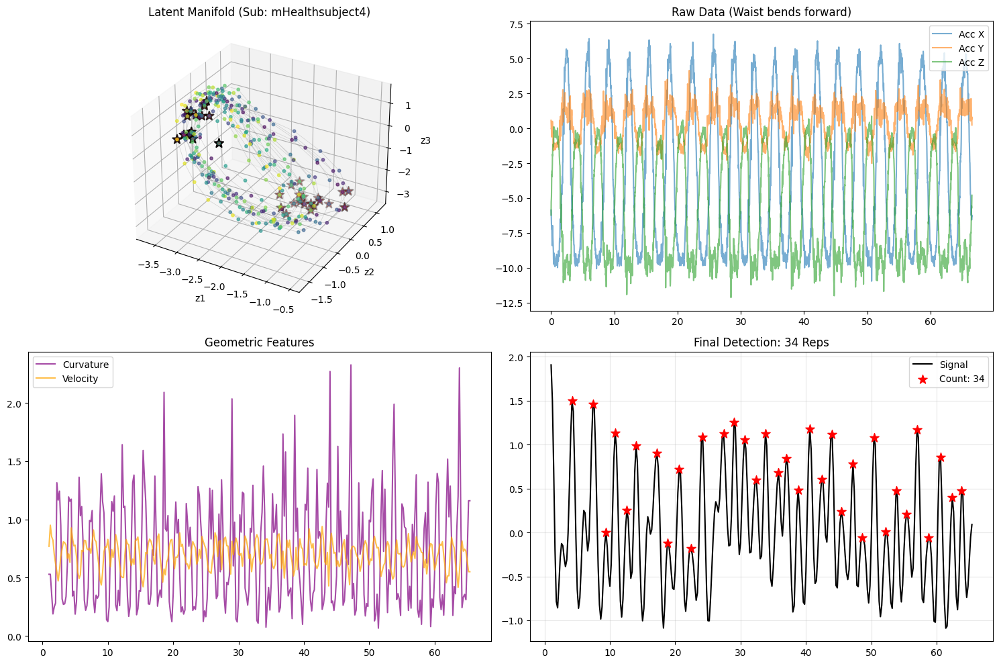


>>> Visualizing mHealthsubject5 - Waist bends forward


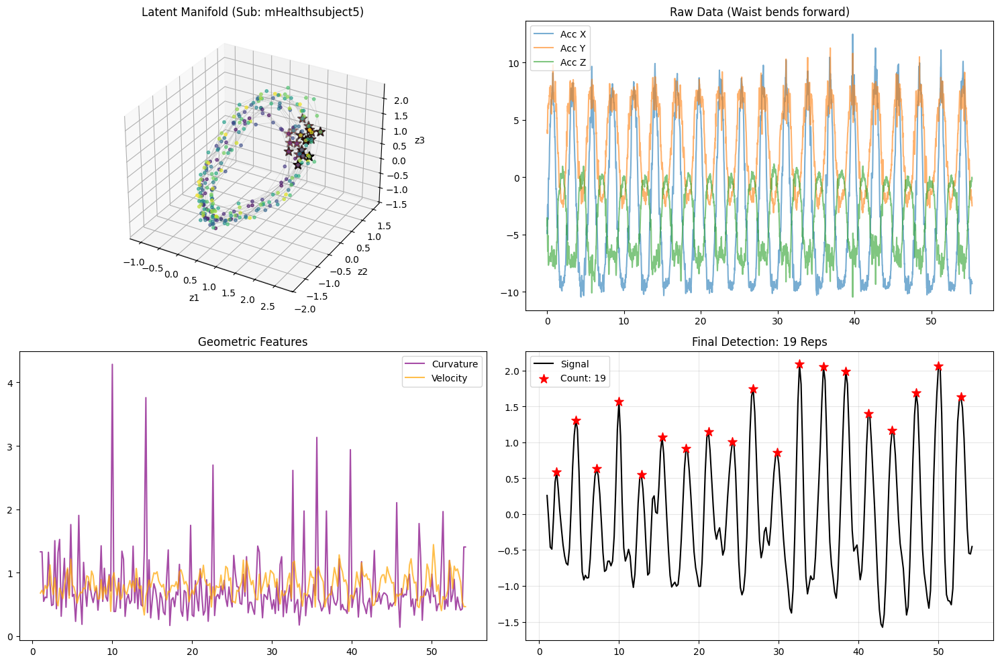


>>> Visualizing mHealthsubject6 - Waist bends forward


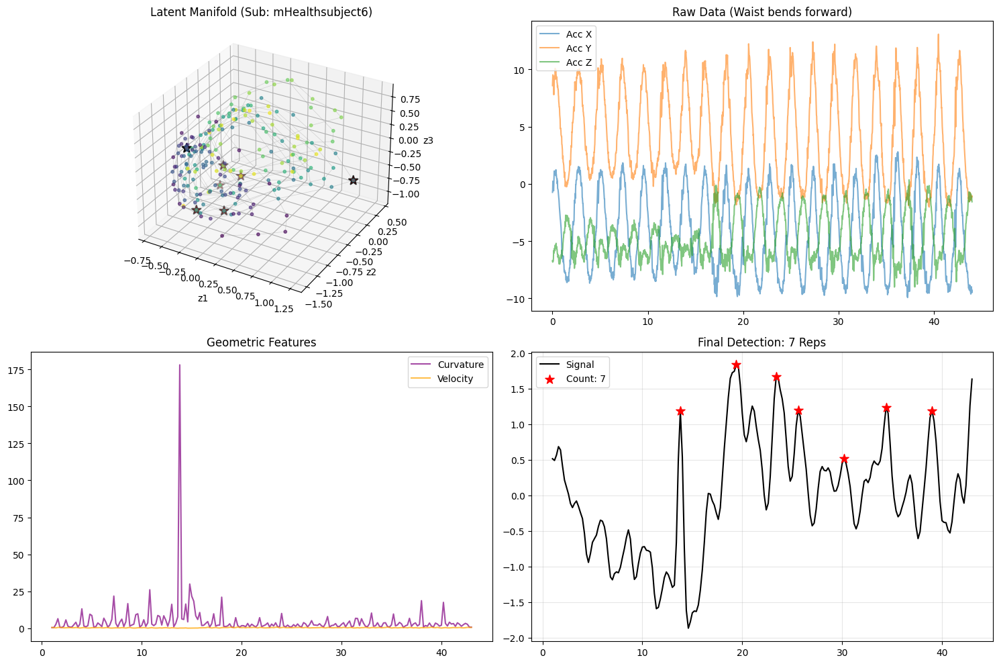


>>> Visualizing mHealthsubject7 - Waist bends forward


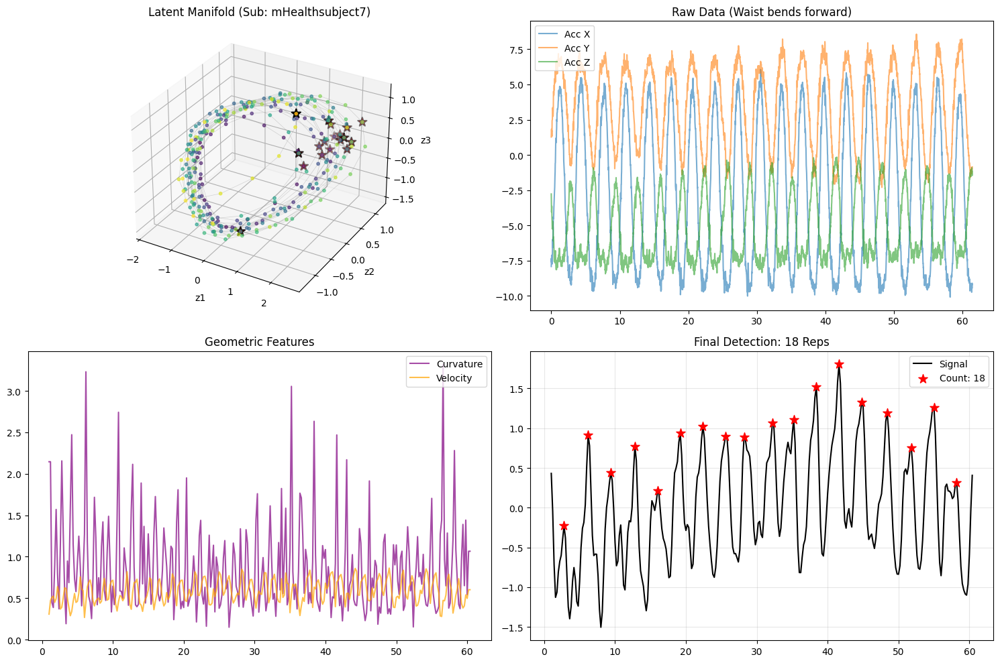


>>> Visualizing mHealthsubject8 - Waist bends forward


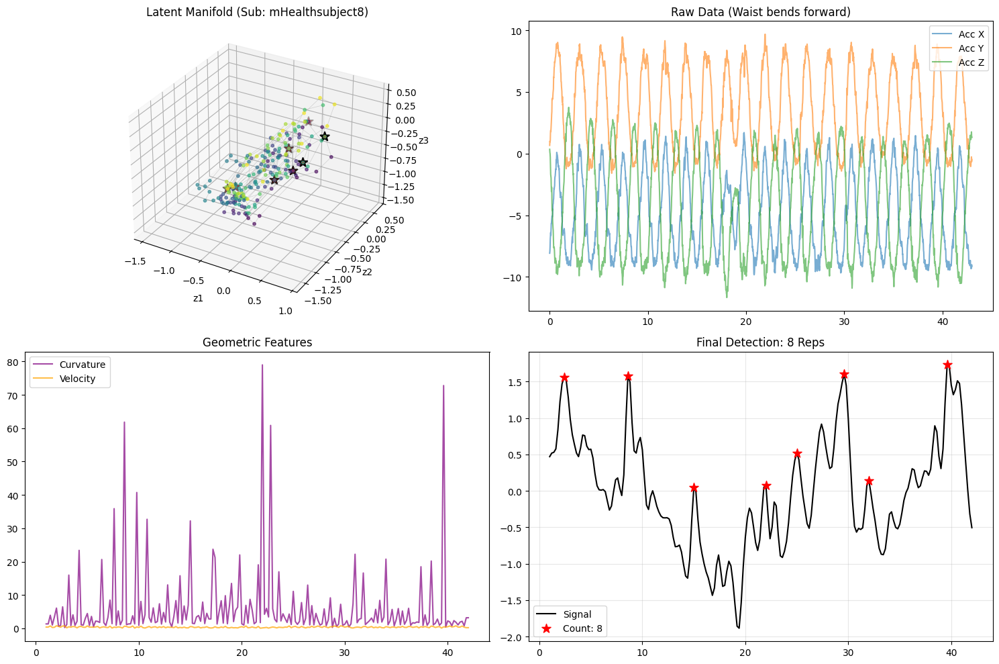


>>> Visualizing mHealthsubject9 - Waist bends forward


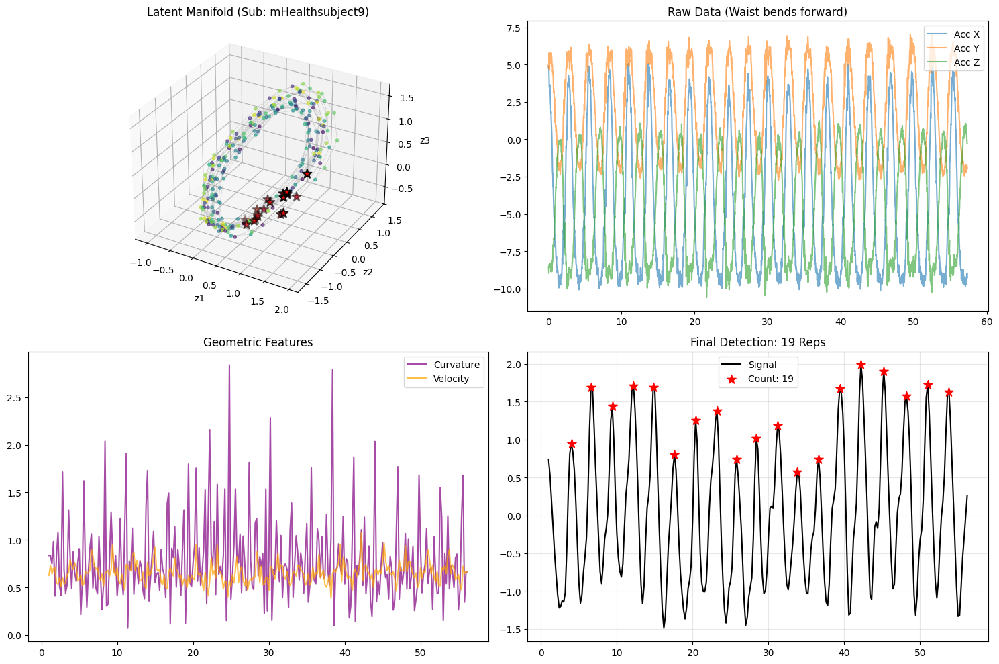


>>> Visualizing mHealthsubject10 - Waist bends forward


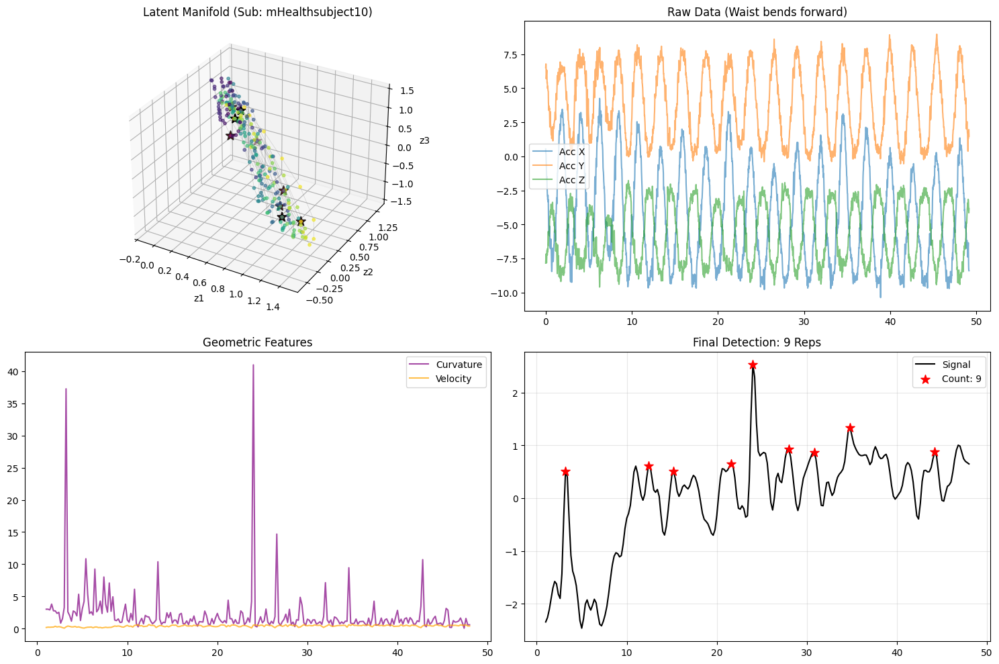


Activity: Frontal elevation of arms (ID: 7)
Using Features: ['acc_arm_x', 'acc_arm_y', 'acc_arm_z', 'gyro_arm_x', 'gyro_arm_y', 'gyro_arm_z']

>>> Visualizing mHealthsubject1 - Frontal elevation of arms


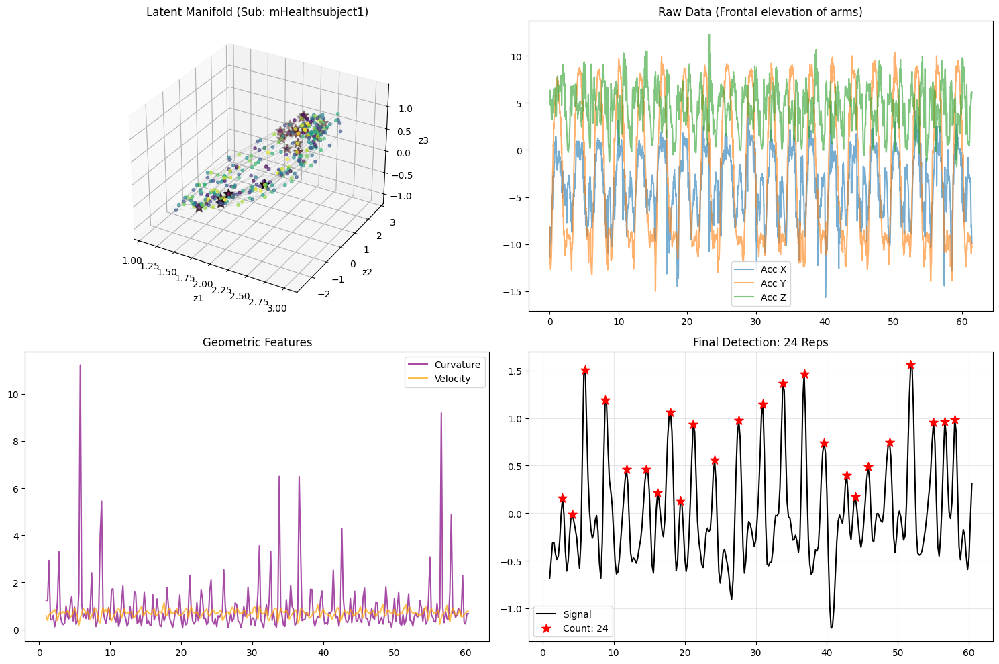


>>> Visualizing mHealthsubject2 - Frontal elevation of arms


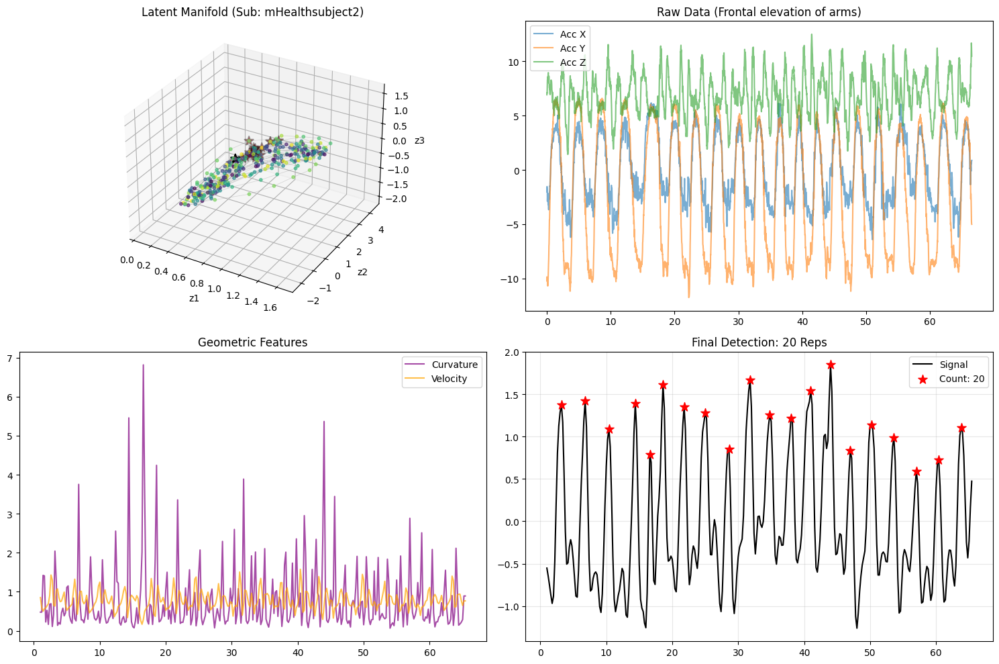


>>> Visualizing mHealthsubject3 - Frontal elevation of arms


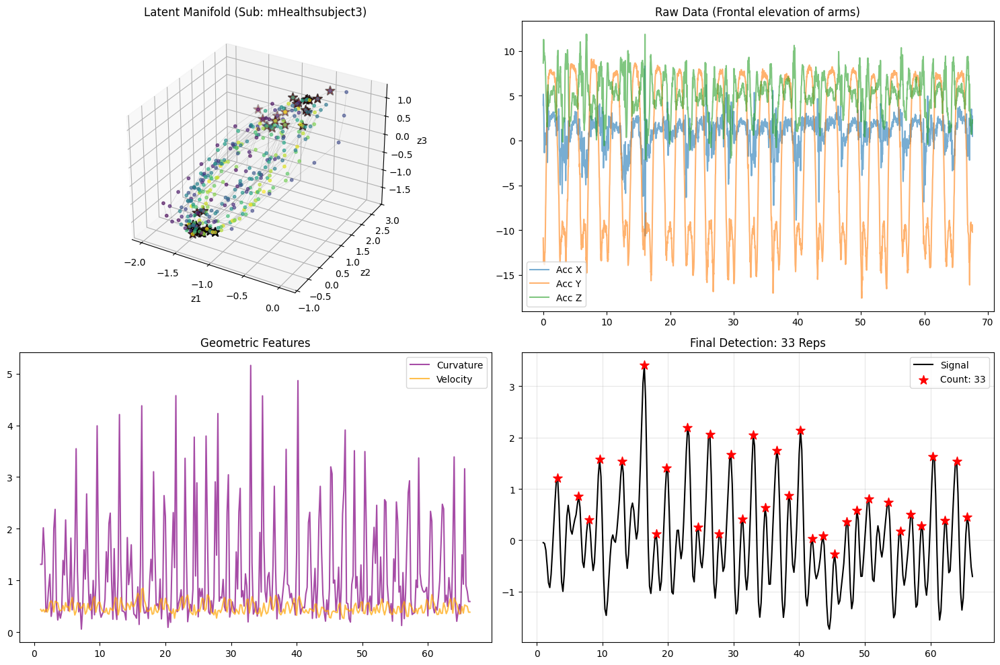


>>> Visualizing mHealthsubject4 - Frontal elevation of arms


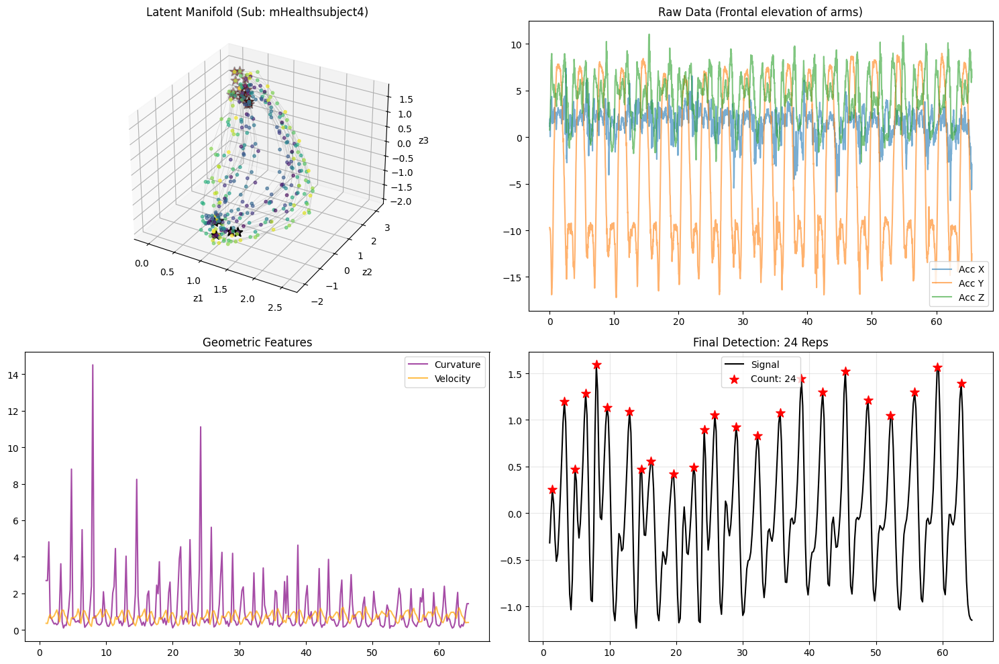


>>> Visualizing mHealthsubject5 - Frontal elevation of arms


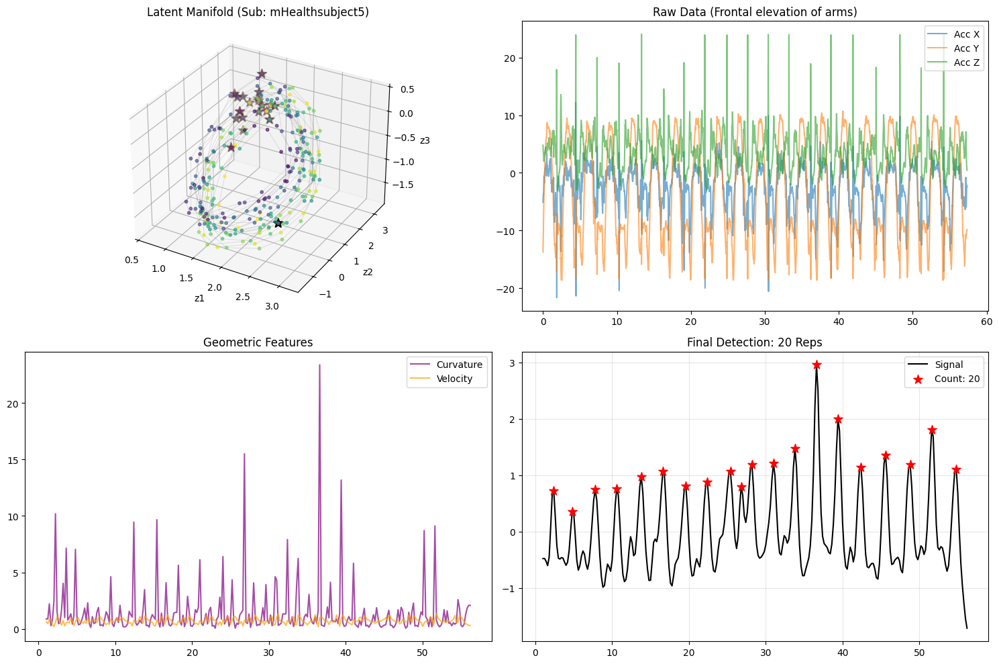


>>> Visualizing mHealthsubject6 - Frontal elevation of arms


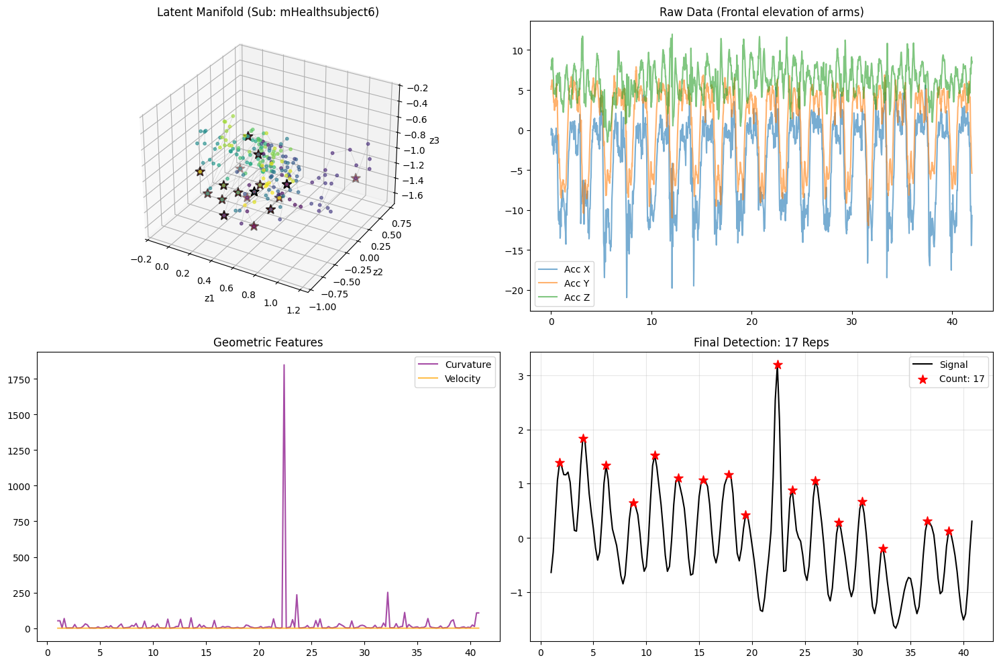


>>> Visualizing mHealthsubject7 - Frontal elevation of arms


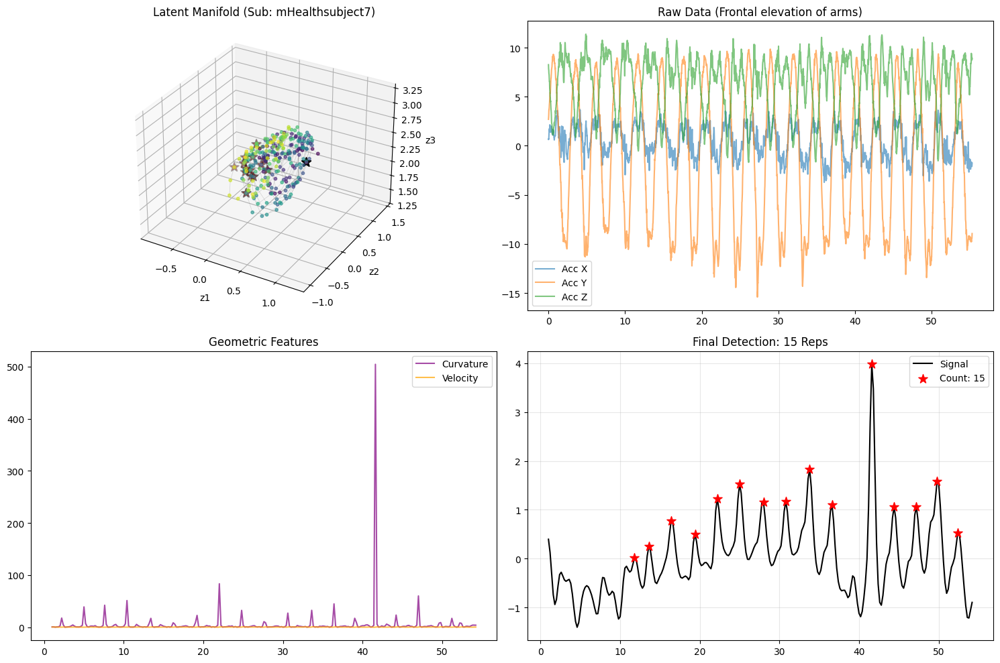


>>> Visualizing mHealthsubject8 - Frontal elevation of arms


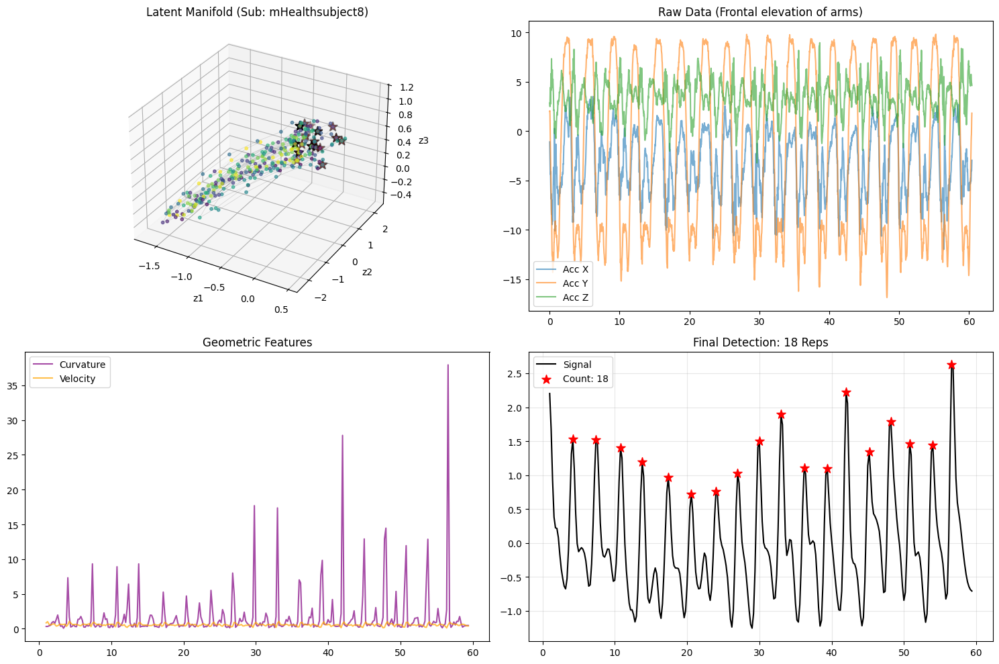


>>> Visualizing mHealthsubject9 - Frontal elevation of arms


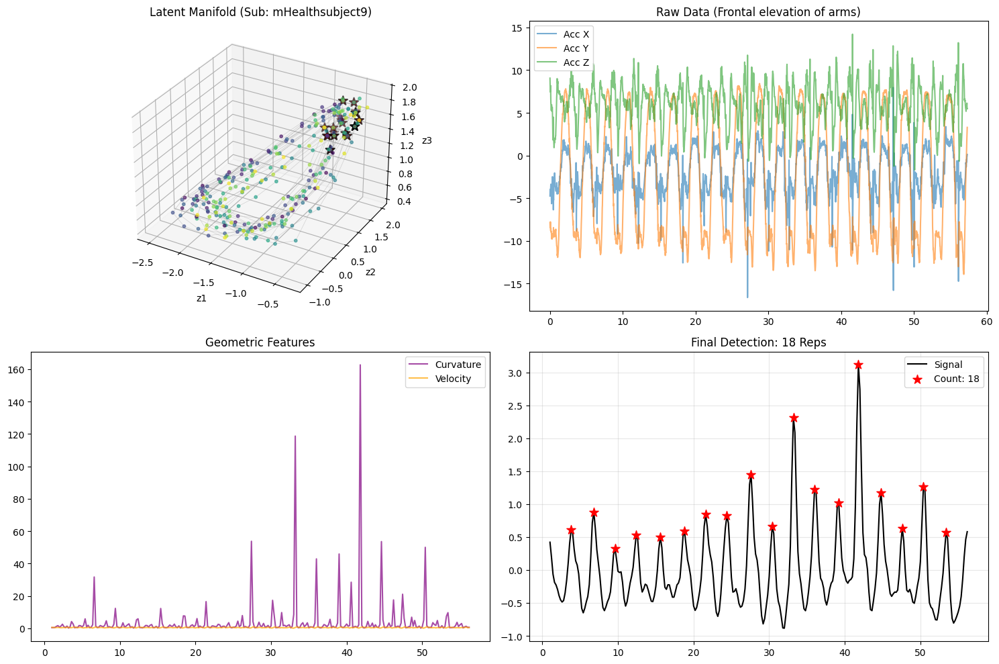


>>> Visualizing mHealthsubject10 - Frontal elevation of arms


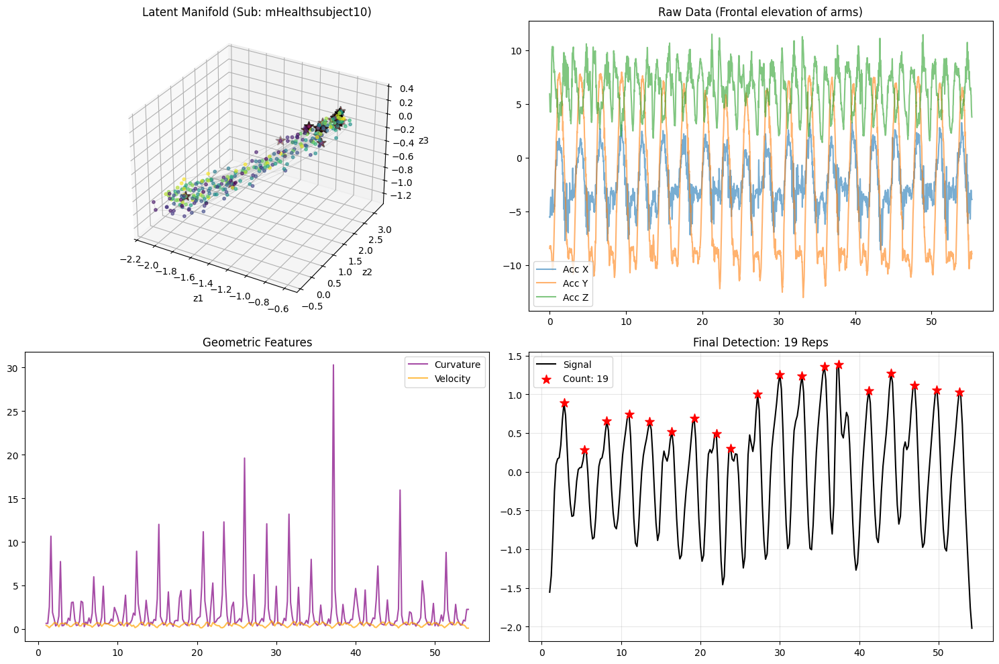


Activity: Knees bending (ID: 8)
Using Features: ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z', 'gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z']

>>> Visualizing mHealthsubject1 - Knees bending


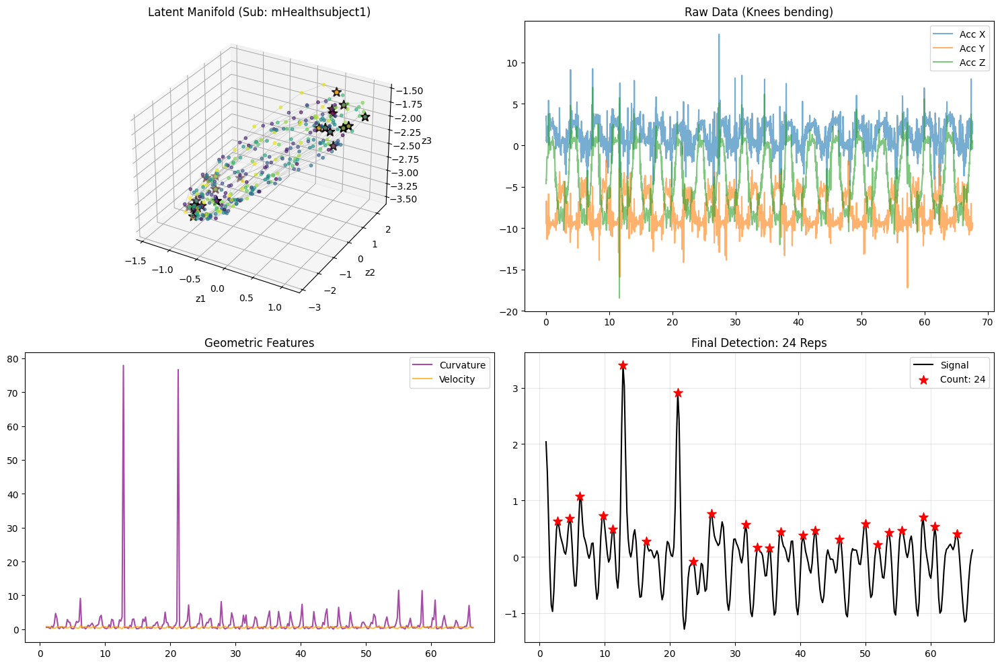


>>> Visualizing mHealthsubject2 - Knees bending


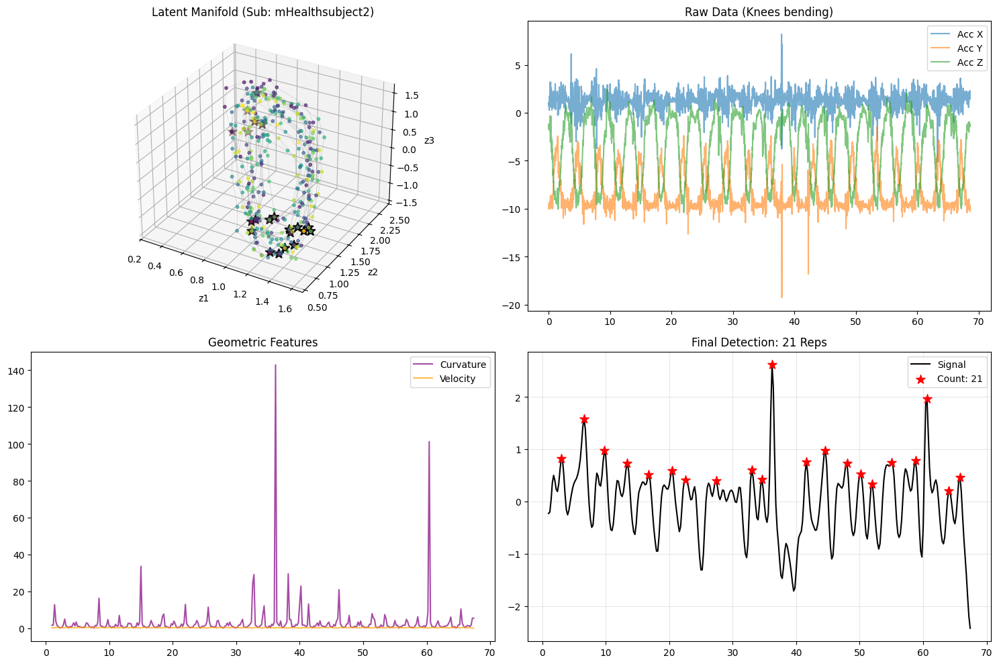


>>> Visualizing mHealthsubject3 - Knees bending


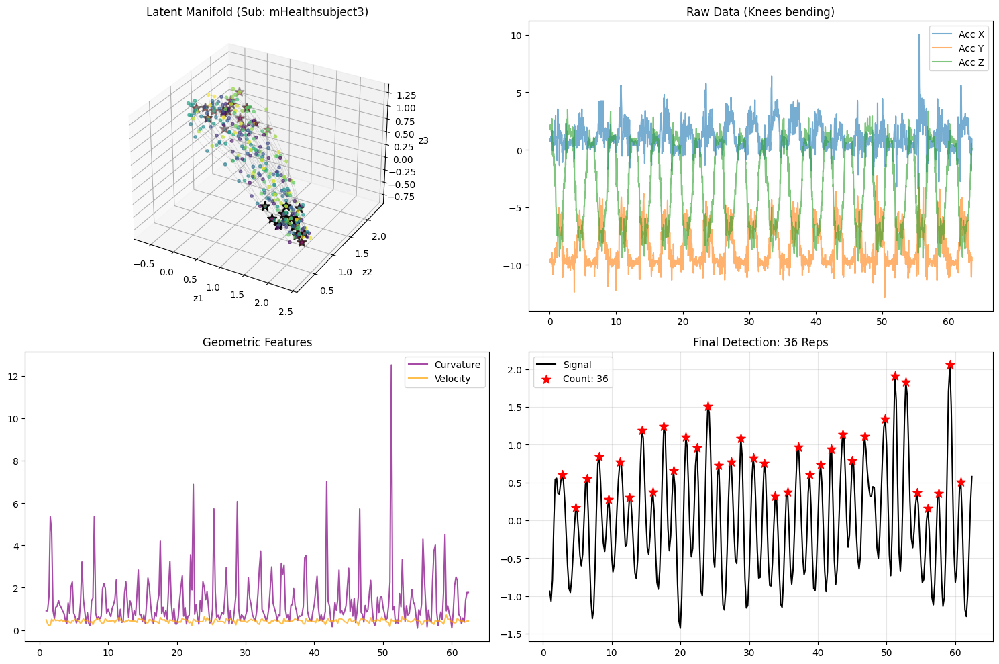


>>> Visualizing mHealthsubject4 - Knees bending


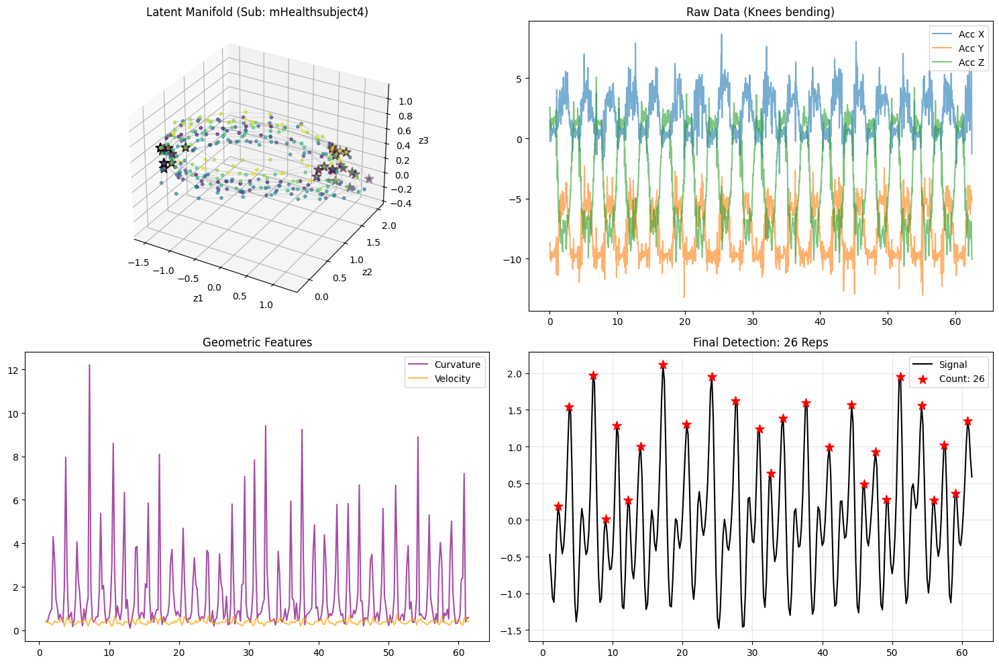


>>> Visualizing mHealthsubject5 - Knees bending


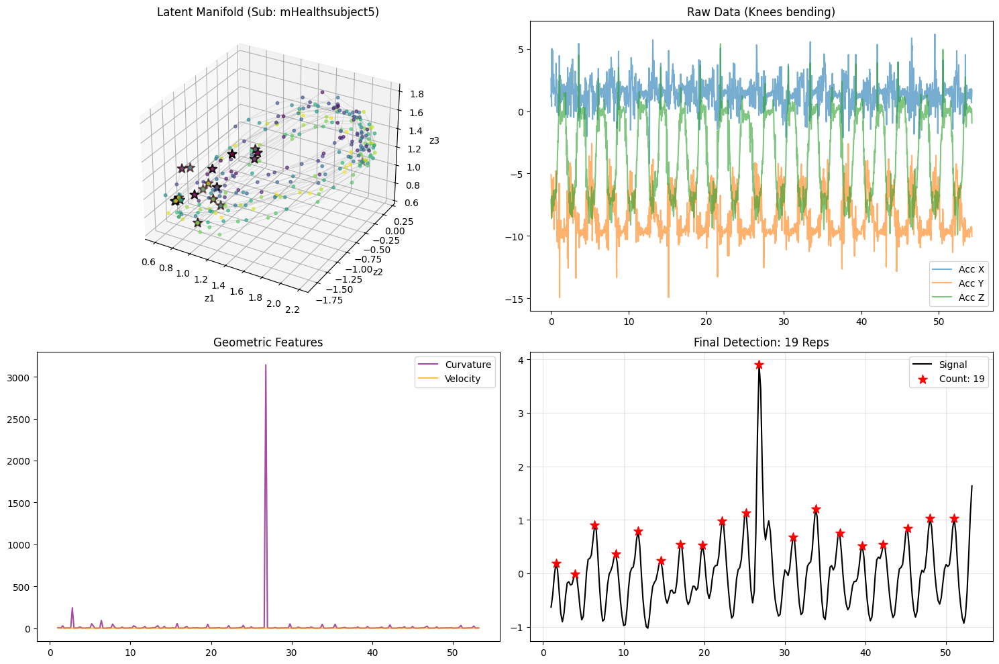


>>> Visualizing mHealthsubject6 - Knees bending


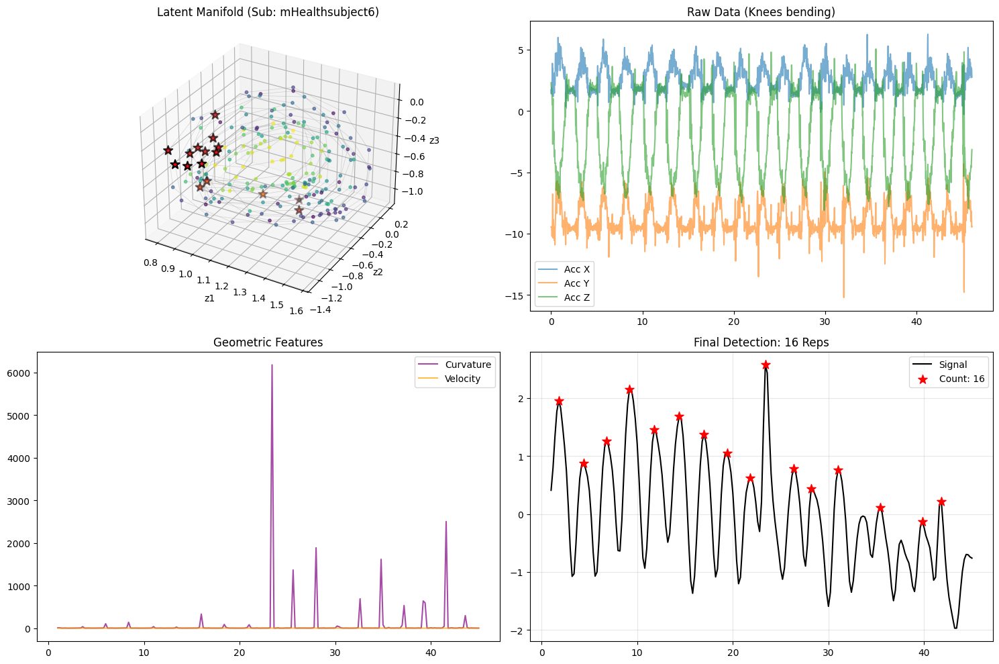


>>> Visualizing mHealthsubject7 - Knees bending


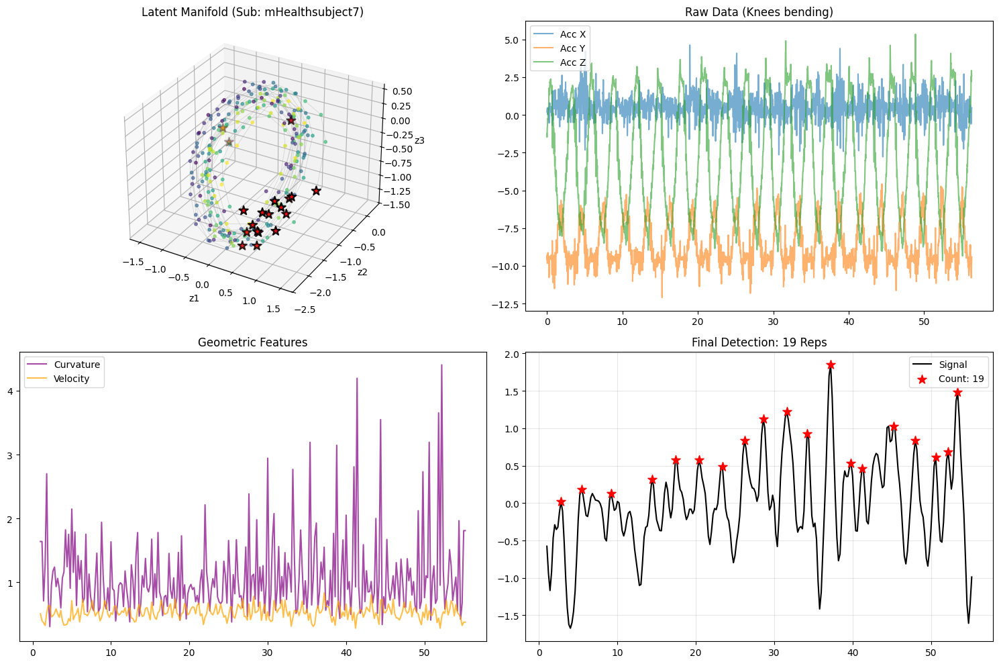


>>> Visualizing mHealthsubject8 - Knees bending


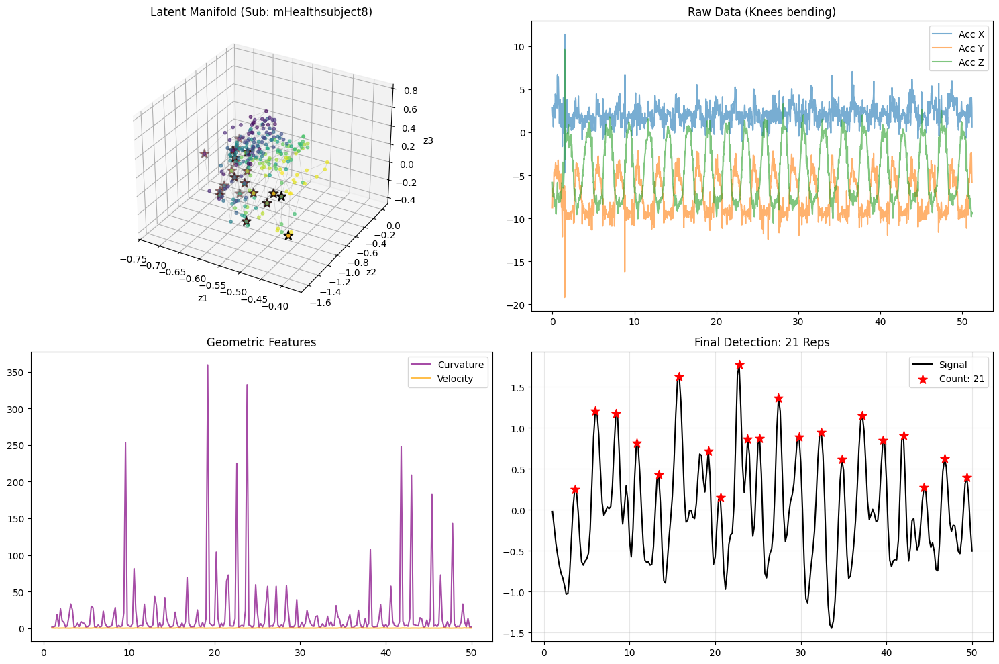


>>> Visualizing mHealthsubject9 - Knees bending


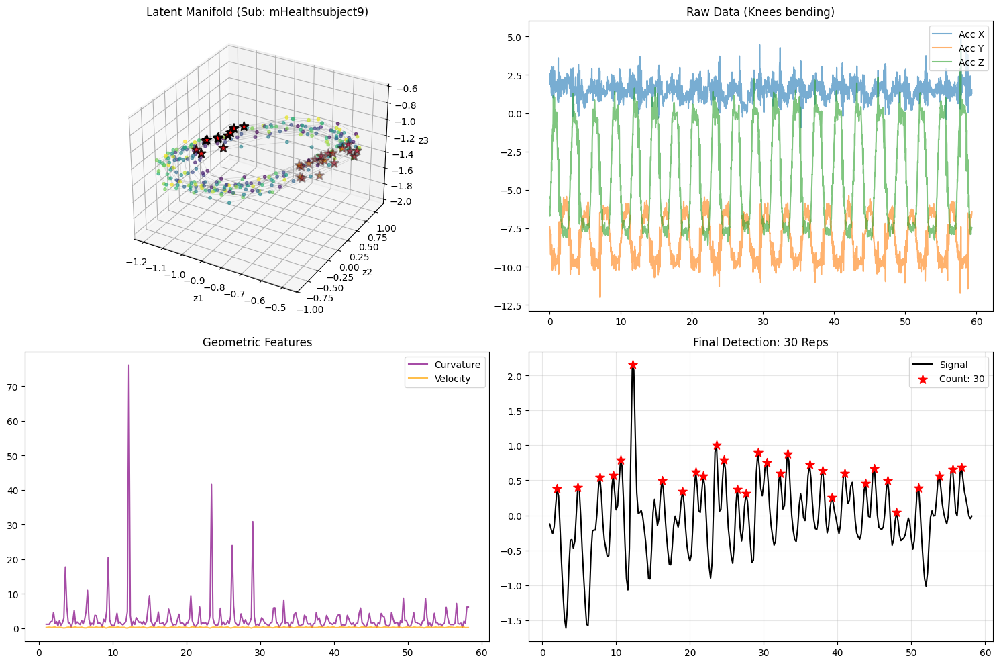


>>> Visualizing mHealthsubject10 - Knees bending


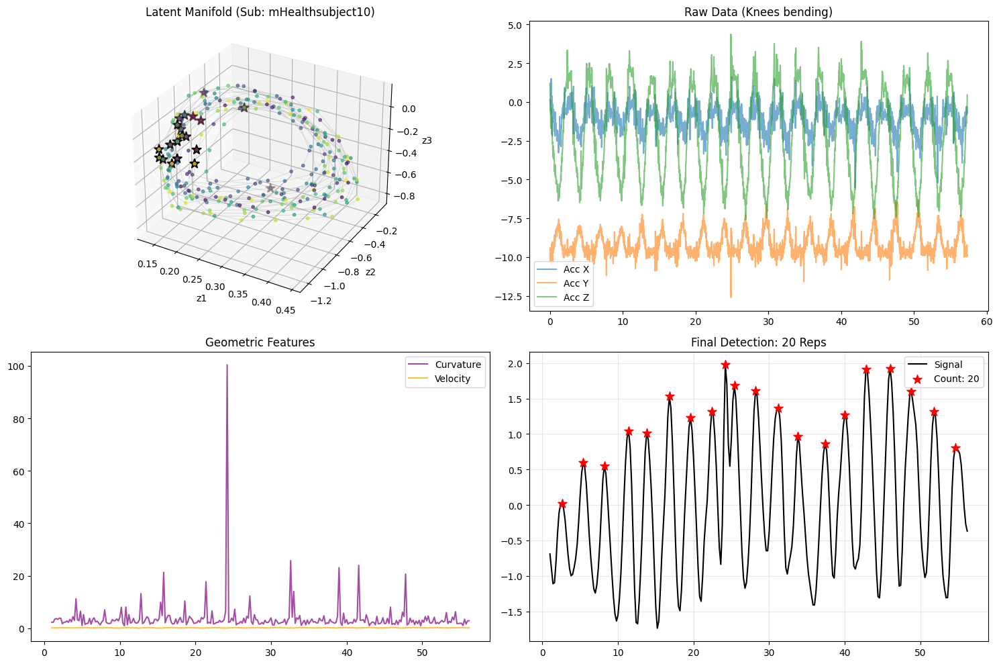


[Final Results Table]
                     Activity           Subject  Count
0         Waist bends forward   mHealthsubject1     26
1         Waist bends forward   mHealthsubject2     18
2         Waist bends forward   mHealthsubject3     35
3         Waist bends forward   mHealthsubject4     34
4         Waist bends forward   mHealthsubject5     19
5         Waist bends forward   mHealthsubject6      7
6         Waist bends forward   mHealthsubject7     18
7         Waist bends forward   mHealthsubject8      8
8         Waist bends forward   mHealthsubject9     19
9         Waist bends forward  mHealthsubject10      9
10  Frontal elevation of arms   mHealthsubject1     24
11  Frontal elevation of arms   mHealthsubject2     20
12  Frontal elevation of arms   mHealthsubject3     33
13  Frontal elevation of arms   mHealthsubject4     24
14  Frontal elevation of arms   mHealthsubject5     20
15  Frontal elevation of arms   mHealthsubject6     17
16  Frontal elevation of arms   mHealthsub

In [1]:
import os
import glob
import random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ==========================================
# 0. Configuration & Seeding
# ==========================================
CONFIG = {
    'data_dir': '/content/drive/MyDrive/Colab Notebooks/HAR_data/MHEALTHDATASET',
    'window_size': 100,
    'stride': 50,
    'batch_size': 64,
    'lr': 1e-3,
    'epochs': 150,  # 시각화 확인용이므로 Epoch 적당히 조절 (속도 up)
    'latent_dim': 3,
    'hidden_dim': 128,
    'lambda_recon': 1.0,
    'lambda_smooth': 0.001,
    'fs': 50,
    'seed': 42,
}

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def set_strict_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_strict_seed(CONFIG['seed'])
g = torch.Generator()
g.manual_seed(CONFIG['seed'])
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

# ==========================================
# 1. Models & Math
# ==========================================
class ManifoldEncoder(nn.Module):
    def __init__(self, input_ch=6, hidden_dim=128, latent_dim=3, win_size=100):
        super().__init__()
        self.conv1 = nn.Conv1d(input_ch, hidden_dim, kernel_size=5, padding=2)
        self.conv2 = nn.Conv1d(hidden_dim, hidden_dim, kernel_size=5, padding=2)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.fc_latent = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, latent_dim)
        )
        self.fc_decode = nn.Linear(latent_dim, hidden_dim * 25)
        self.deconv1 = nn.ConvTranspose1d(hidden_dim, hidden_dim, kernel_size=4, stride=2, padding=1)
        self.deconv2 = nn.ConvTranspose1d(hidden_dim, hidden_dim, kernel_size=4, stride=2, padding=1)
        self.final = nn.Conv1d(hidden_dim, input_ch, kernel_size=3, padding=1)

    def encode(self, x):
        h = F.relu(self.conv1(x))
        h = F.relu(self.conv2(h))
        h = self.pool(h).squeeze(-1)
        z = self.fc_latent(h)
        return z

    def decode(self, z):
        h = self.fc_decode(z).view(-1, 128, 25)
        h = F.relu(self.deconv1(h))
        h = F.relu(self.deconv2(h))
        out = self.final(h)
        return out

    def forward(self, x):
        z = self.encode(x)
        recon = self.decode(z)
        return z, recon

def compute_curvature(trajectory):
    if len(trajectory) < 3: return torch.zeros(1)
    v = trajectory[1:-1] - trajectory[:-2]
    v_next = trajectory[2:] - trajectory[1:-1]
    a = v_next - v
    v_norm = torch.norm(v, dim=1, keepdim=True) + 1e-8
    a_norm = torch.norm(a, dim=1, keepdim=True) + 1e-8
    curvature = a_norm.squeeze() / (v_norm.squeeze() ** 2 + 1e-8)
    return curvature

def compute_velocity(trajectory):
    if len(trajectory) < 2: return torch.zeros(1)
    v = trajectory[1:] - trajectory[:-1]
    return torch.norm(v, dim=1)

def compute_trajectory_divergence(trajectory, window=5):
    if len(trajectory) < window * 2: return torch.zeros(len(trajectory))
    divergence = []
    for i in range(len(trajectory)):
        start = max(0, i - window)
        end = min(len(trajectory), i + window + 1)
        centroid = trajectory[start:end].mean(dim=0)
        div = torch.norm(trajectory[i] - centroid)
        divergence.append(div.item())
    return np.array(divergence)

# ==========================================
# 2. Visualization Function
# ==========================================
def visualize_manifold_analysis(raw_vals, latent_points, curvature, velocity,
                                divergence, transition_signal, peaks,
                                config, step, sub, act):
    """
    Trajectory와 Signal을 시각화하여 HQ/LQ 여부를 눈으로 확인
    """
    time_axis_raw = np.arange(len(raw_vals)) / config['fs']
    time_axis_latent = (np.arange(len(latent_points)) * step + config['window_size']//2) / config['fs']

    fig = plt.figure(figsize=(15, 10))

    # 1. 3D Trajectory (핵심: 여기가 찌그러져 있으면 LQ)
    ax1 = fig.add_subplot(2, 2, 1, projection='3d')
    if latent_points.shape[1] >= 3:
        scatter = ax1.scatter(latent_points[:, 0], latent_points[:, 1], latent_points[:, 2],
                            c=np.arange(len(latent_points)), cmap='viridis', s=10, alpha=0.6)
        ax1.plot(latent_points[:, 0], latent_points[:, 1], latent_points[:, 2],
                'gray', alpha=0.3, linewidth=0.5)
        if len(peaks) > 0:
            ax1.scatter(latent_points[peaks, 0], latent_points[peaks, 1], latent_points[peaks, 2],
                       c='red', s=100, marker='*', edgecolors='black', linewidths=1.5)
        ax1.set_title(f'Latent Manifold (Sub: {sub})')
        ax1.set_xlabel('z1'); ax1.set_ylabel('z2'); ax1.set_zlabel('z3')

    # 2. Raw Signal (참고용)
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.plot(time_axis_raw, raw_vals[:, 0], label='Acc X', alpha=0.6)
    ax2.plot(time_axis_raw, raw_vals[:, 1], label='Acc Y', alpha=0.6)
    ax2.plot(time_axis_raw, raw_vals[:, 2], label='Acc Z', alpha=0.6)
    ax2.set_title(f'Raw Data ({act})')
    ax2.legend()

    # 3. Geometric Features (Curvature, Velocity)
    ax3 = fig.add_subplot(2, 2, 3)
    ax3.plot(time_axis_latent, curvature, label='Curvature', color='purple', alpha=0.7)
    ax3.plot(time_axis_latent, velocity, label='Velocity', color='orange', alpha=0.7)
    ax3.set_title('Geometric Features')
    ax3.legend()

    # 4. Final Detection (Count 확인)
    ax4 = fig.add_subplot(2, 2, 4)
    ax4.plot(time_axis_latent, transition_signal, color='black', linewidth=1.5, label='Signal')
    ax4.scatter(time_axis_latent[peaks], transition_signal[peaks],
               c='red', s=100, marker='*', zorder=5, label=f'Count: {len(peaks)}')
    ax4.set_title(f'Final Detection: {len(peaks)} Reps')
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# ==========================================
# 3. Data Processing & Training
# ==========================================
class RawSequenceDataset(Dataset):
    def __init__(self, sequences):
        self.sequences = sequences
    def __len__(self):
        return len(self.sequences)
    def __getitem__(self, idx):
        return torch.tensor(self.sequences[idx], dtype=torch.float32).transpose(0, 1)

COLUMN_NAMES = [
    'acc_chest_x', 'acc_chest_y', 'acc_chest_z',
    'ecg_1', 'ecg_2',
    'acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z',
    'gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z',
    'mag_ankle_x', 'mag_ankle_y', 'mag_ankle_z',
    'acc_arm_x', 'acc_arm_y', 'acc_arm_z',
    'gyro_arm_x', 'gyro_arm_y', 'gyro_arm_z',
    'mag_arm_x', 'mag_arm_y', 'mag_arm_z',
    'activity_id'
]
TARGET_ACTIVITIES_MAP = {6: 'Waist bends forward', 7: 'Frontal elevation of arms', 8: 'Knees bending'}

ACT_FEATURE_MAP = {
    6: ['acc_chest_x', 'acc_chest_y', 'acc_chest_z', 'acc_arm_x', 'acc_arm_y', 'acc_arm_z'],
    7: ['acc_arm_x', 'acc_arm_y', 'acc_arm_z', 'gyro_arm_x', 'gyro_arm_y', 'gyro_arm_z'],
    8: ['acc_ankle_x', 'acc_ankle_y', 'acc_ankle_z', 'gyro_ankle_x', 'gyro_ankle_y', 'gyro_ankle_z']
}

def load_mhealth_dataset(data_dir):
    full_dataset = {}
    file_list = sorted(glob.glob(os.path.join(data_dir, "mHealth_subject*.log")))
    if not file_list: return {}
    print(f"Loading {len(file_list)} subjects...")
    for file_path in file_list:
        file_name = os.path.basename(file_path)
        subj_id = file_name.split('.')[0].replace('_', '')
        try:
            df = pd.read_csv(file_path, sep="\t", header=None)
            df = df.iloc[:, :len(COLUMN_NAMES)]; df.columns = COLUMN_NAMES
            subj_data = {}
            for label_code, activity_name in TARGET_ACTIVITIES_MAP.items():
                activity_df = df[df['activity_id'] == label_code].copy()
                if not activity_df.empty:
                    subj_data[activity_name] = activity_df.drop(columns=['activity_id'])
            full_dataset[subj_id] = subj_data
        except: pass
    return full_dataset

def create_windows(dataset_dict, subjects, act_name, feature_cols):
    windows, all_data = [], []
    for sub in subjects:
        if sub in dataset_dict and act_name in dataset_dict[sub]:
            all_data.append(dataset_dict[sub][act_name][feature_cols].values)
    if not all_data: return np.array([]), 0, 1

    cat_data = np.concatenate(all_data, axis=0)
    mean, std = np.mean(cat_data, axis=0), np.std(cat_data, axis=0) + 1e-6

    for sub in subjects:
        if sub in dataset_dict and act_name in dataset_dict[sub]:
            raw = dataset_dict[sub][act_name][feature_cols].values
            norm = (raw - mean) / std
            for i in range(0, len(norm) - CONFIG['window_size'], CONFIG['stride']):
                windows.append(norm[i : i + CONFIG['window_size']])
    return np.array(windows), mean, std

def train_silent(model, loader, config):
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'])
    model.train()
    for _ in range(config['epochs']):
        for x in loader:
            x = x.to(DEVICE)
            z, recon = model(x)
            loss = config['lambda_recon'] * F.mse_loss(recon, x)
            if len(z) > 1:
                loss += config['lambda_smooth'] * torch.mean(torch.norm(z[1:] - z[:-1], dim=1))
            optimizer.zero_grad(); loss.backward(); optimizer.step()
    return model

# ==========================================
# 4. Evaluation + Visualization
# ==========================================
def evaluate_and_visualize(model, dataset_dict, test_sub, act_name, config, mean, std, feature_cols):
    model.eval()
    if test_sub not in dataset_dict or act_name not in dataset_dict[test_sub]: return 0

    raw_vals = dataset_dict[test_sub][act_name][feature_cols].values
    if len(raw_vals) < config['window_size']: return 0

    norm_vals = (raw_vals - mean) / std
    latent_points = []
    step = 10

    with torch.no_grad():
        for i in range(0, len(norm_vals) - config['window_size'], step):
            segment = norm_vals[i : i + config['window_size']]
            x_in = torch.tensor(segment, dtype=torch.float32).transpose(0, 1).unsqueeze(0).to(DEVICE)
            z, _ = model(x_in)
            latent_points.append(z.cpu().numpy())

    if not latent_points: return 0
    latent_points = np.concatenate(latent_points, axis=0)

    # Calculate Signals
    latent_tensor = torch.tensor(latent_points, dtype=torch.float32)
    c = compute_curvature(latent_tensor).numpy()
    v = compute_velocity(latent_tensor).numpy()
    d = compute_trajectory_divergence(latent_tensor)

    # Normalize & Combine
    c_pad = np.pad(c, (1, 1), mode='edge')
    v_pad = np.pad(v, (0, 1), mode='edge')

    c_norm = (c_pad - np.mean(c_pad)) / (np.std(c_pad) + 1e-6)
    v_norm = (v_pad - np.mean(v_pad)) / (np.std(v_pad) + 1e-6)
    d_norm = (d - np.mean(d)) / (np.std(d) + 1e-6)

    signal = c_norm + v_norm + 0.5 * d_norm
    smoothed = gaussian_filter1d(signal, sigma=1.5)

    # Peak Detection
    peaks, _ = find_peaks(smoothed,
                          height=np.percentile(smoothed, 40),
                          prominence=0.8 * np.std(smoothed),
                          distance=int((0.8 * config['fs']) / step))

    # [VISUALIZATION CALL]
    print(f"\n>>> Visualizing {test_sub} - {act_name}")
    visualize_manifold_analysis(raw_vals, latent_points, c_pad, v_pad, d, smoothed, peaks, config, step, test_sub, act_name)

    return len(peaks)

# ==========================================
# 5. Main Execution
# ==========================================
def run_loso_with_vis():
    full_dataset = load_mhealth_dataset(CONFIG['data_dir'])
    if not full_dataset: return

    all_subjects = [f'mHealthsubject{i}' for i in range(1, 11)]
    # 3가지 동작 모두 수행
    target_acts = [6, 7, 8]

    results = []

    for act_id in target_acts:
        act_name = TARGET_ACTIVITIES_MAP[act_id]
        current_features = ACT_FEATURE_MAP[act_id]

        print(f"\n{'='*60}\nActivity: {act_name} (ID: {act_id})")
        print(f"Using Features: {current_features}")
        print(f"{'='*60}")

        for i, test_sub in enumerate(all_subjects):
            set_strict_seed(CONFIG['seed'])

            # LOSO Split
            train_subs = [s for s in all_subjects if s != test_sub]
            train_windows, train_mean, train_std = create_windows(full_dataset, train_subs, act_name, current_features)

            if len(train_windows) == 0: continue

            # Train
            model = ManifoldEncoder(input_ch=6).to(DEVICE)
            train_loader = DataLoader(RawSequenceDataset(train_windows), batch_size=64, shuffle=True)
            model = train_silent(model, train_loader, CONFIG)

            # Eval & Visualize
            count = evaluate_and_visualize(model, full_dataset, test_sub, act_name, CONFIG, train_mean, train_std, current_features)
            results.append({'Activity': act_name, 'Subject': test_sub, 'Count': count})

    # Final Summary
    df = pd.DataFrame(results)
    print("\n[Final Results Table]")
    print(df)
    print("\n[Stats per Activity]")
    print(df.groupby('Activity')['Count'].agg(['mean', 'std', 'min', 'max']))

if __name__ == '__main__':
    run_loso_with_vis()